In [178]:
import cv2
import numpy as np
from skimage.metrics import peak_signal_noise_ratio as psnr
from skimage.metrics import structural_similarity as ssim
from matplotlib import pyplot as plt
import tensorflow as tf
from patchify import patchify, unpatchify
from file_utils import get_file_names_from_folder

In [179]:
def load_image(path):
    
    gt_img = cv2.imread(path)
    gt_img = cv2.cvtColor(gt_img, cv2.COLOR_BGR2RGB)
    print(path, gt_img.shape, gt_img.shape[0] // 64)
    gt_img = cv2.resize(gt_img, (64 * (gt_img.shape[0] // 64), 64 * (gt_img.shape[1] // 64)))
    print(path, gt_img.shape)
    gt_img = gt_img/255

    return gt_img

def denoise_gaussian(image):
    
    return [];

def calculate_key_metrics(gt_image, noise_image):
    psnr_value = psnr(gt_image, noise_image)
    ssim_value = ssim(gt_image, noise_image, channel_axis=2, data_range=noise_image.max() - noise_image.min())
    return (psnr_value, ssim_value)

# load test set
images = []
gt_image=load_image('data/Mi3_Aligned/Batch_001/IMG_20160202_015216Reference.bmp')
file_names = get_file_names_from_folder('data/Mi3_Aligned/Batch_001/', '*Noisy.bmp*')
for file_name in file_names:
    images.append(load_image(file_name))

data/Mi3_Aligned/Batch_001/IMG_20160202_015216Reference.bmp (3000, 3000, 3) 46
data/Mi3_Aligned/Batch_001/IMG_20160202_015216Reference.bmp (2944, 2944, 3)
['data/Mi3_Aligned/Batch_001/IMG_20160202_015252Noisy.bmp', 'data/Mi3_Aligned/Batch_001/IMG_20160202_015247Noisy.bmp']
data/Mi3_Aligned/Batch_001/IMG_20160202_015252Noisy.bmp
data/Mi3_Aligned/Batch_001/IMG_20160202_015252Noisy.bmp (3000, 3000, 3) 46
data/Mi3_Aligned/Batch_001/IMG_20160202_015252Noisy.bmp (2944, 2944, 3)
data/Mi3_Aligned/Batch_001/IMG_20160202_015247Noisy.bmp
data/Mi3_Aligned/Batch_001/IMG_20160202_015247Noisy.bmp (3000, 3000, 3) 46
data/Mi3_Aligned/Batch_001/IMG_20160202_015247Noisy.bmp (2944, 2944, 3)


(Text(0.5, 1.0, 'Noise image'), (-0.5, 2943.5, 2943.5, -0.5))

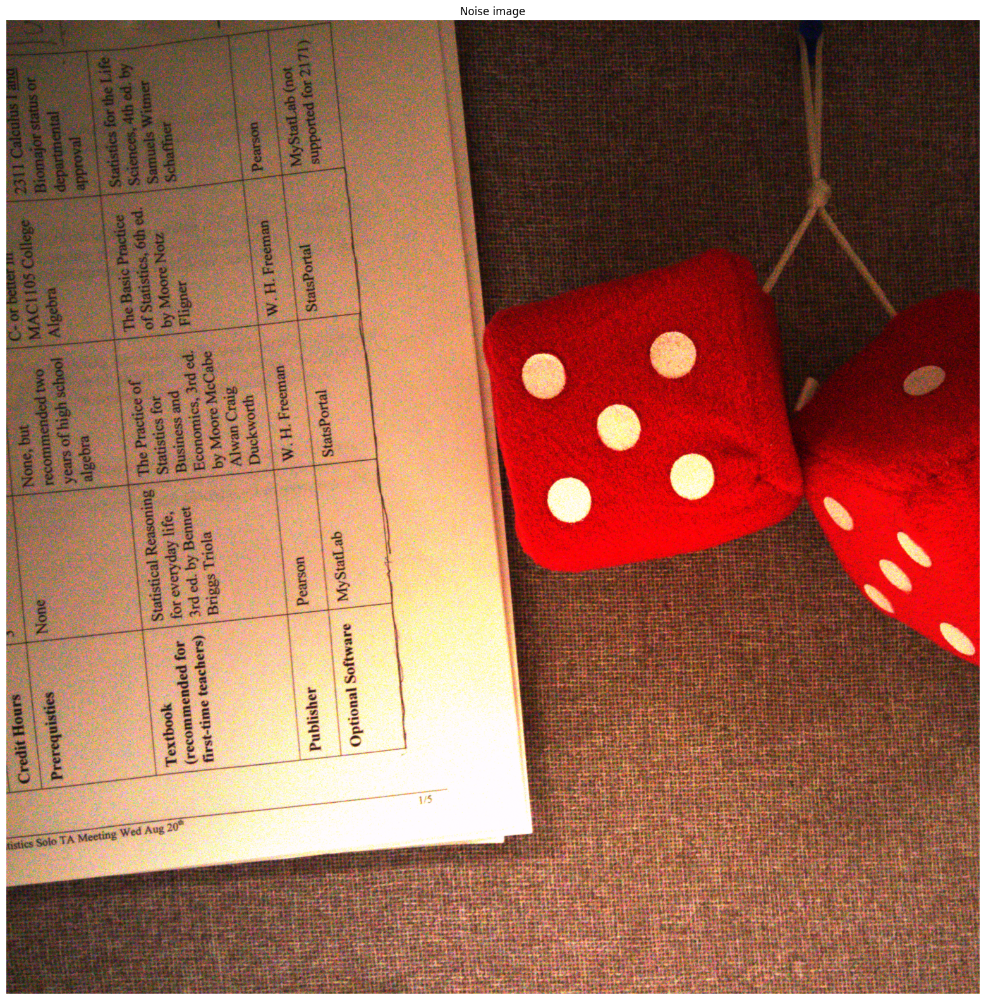

In [180]:
index = np.random.randint(0, len(images))
plt.imshow(images[index])
image = images[index]
plt.title('Noise image'), plt.axis(False)

In [181]:
# split images to pathes
image_pathes = patchify(image, (64, 64, 3), step=64)
image_shape = image_pathes.shape
original_image = unpatchify(image_pathes, image.shape)
#plt.imshow(unpatchify(image_pathes, image.shape))
image_pathes = image_pathes.reshape((-1,64, 64,3))

(2944, 2944, 3)


In [182]:
#load model
new_model = tf.keras.models.load_model('model_patches_64_40_e_256_2_dataset_30_big_images')


In [183]:
predictions = new_model.predict(image_pathes)
predicted = np.reshape(predictions, image_shape)
predicted_image = unpatchify(predicted, image.shape)
gaussian_image = cv2.GaussianBlur(image,(5,5),0)

67/67 [==============================] - 4s 56ms/step


(Text(0.5, 1.0, 'Gaussian Blur image'), (-0.5, 199.5, 199.5, -0.5))

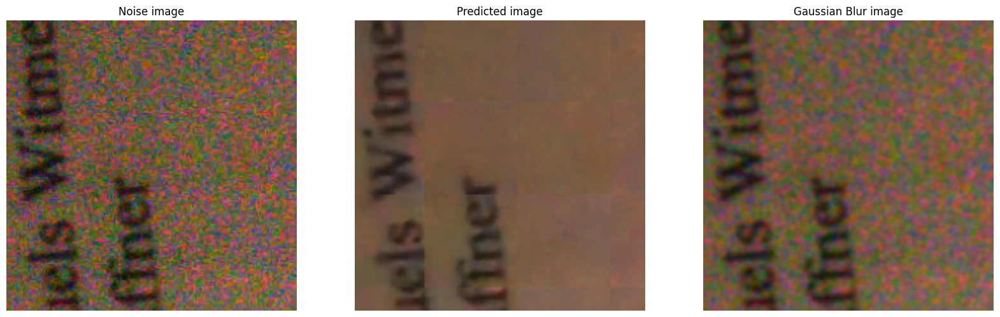

In [187]:
plt.rcParams['figure.figsize'] = [20, 20]
plt.subplot(1, 3, 1), plt.imshow(image[200:400,400:600:])
plt.title('Noise image'), plt.axis(False)
plt.subplot(1, 3, 2), plt.imshow(predicted_image[200:400,400:600:])
plt.title('Predicted image'), plt.axis(False)
plt.subplot(1, 3, 3), plt.imshow(gaussian_image[200:400,400:600:])
plt.title('Gaussian Blur image'), plt.axis(False)

(Text(0.5, 1.0, 'Gaussian Blur image'), (-0.5, 2943.5, 2943.5, -0.5))

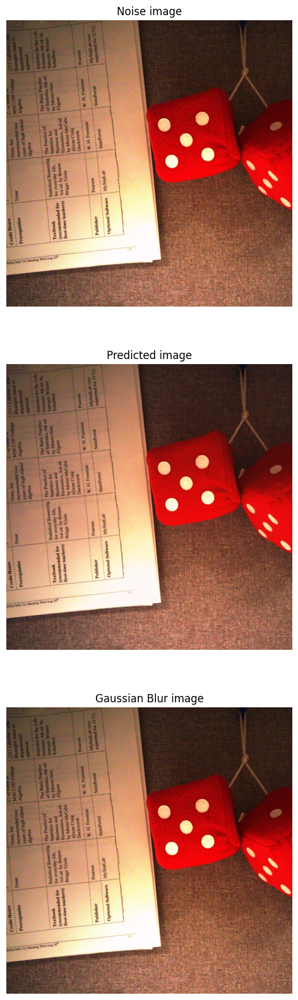

In [189]:
plt.rcParams['figure.figsize'] = [40, 20]
plt.subplot(3, 1, 1), plt.imshow(image)
plt.title('Noise image'), plt.axis(False)
plt.subplot(3, 1, 2), plt.imshow(predicted_image)
plt.title('Predicted image'), plt.axis(False)
plt.subplot(3, 1, 3), plt.imshow(gaussian_image)
plt.title('Gaussian Blur image'), plt.axis(False)

In [185]:

metrics_denoised = calculate_key_metrics(gt_image, predicted_image)
print('Peak Signal to Noise Ratio after network:', metrics_denoised[0])
print('Peak Signal to Noise Ratio after network:', metrics_denoised[0])
metrics_gaussian = calculate_key_metrics(gt_image, gaussian_image)
print(metrics_gaussian)

/var/folders/zr/m75tnm4s4p1cj7v9pr8mtrdr0000gn/T/ipykernel_36843/4270568163.py:17: UserWarning: Inputs have mismatched dtype.  Setting data_range based on image_true.
  psnr_value = psnr(gt_image, noise_image)


(28.427418867002313, 0.7877453919829057)
(24.548708664112656, 0.5715826123001535)
